**Сборный прокт 5. Поиск по изображениям**
_____
**Описание исследования.**

На фотохостинге для профессиональных фотографов «Со Смыслом» (“With Sense”),
пользователи размещают свои фотографии и сопровождают их полным описанием: указывают место съёмок, модель камеры и т. д.

Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала.


В некоторых странах, где работает компания With Sense, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:
⎢ This image is unavailable in your country in compliance with local laws.
Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому необходимо очистить данные от проблемного контента. Во время тестирования модели при появлении в запросе “вредного” контента должен отображаться дисклеймер.
_____
**Цель исследования.**

Предстоит заняться экспериментом по разработке поиска референсных фотографий для фотографов.
Суть поиска заключается в следующем: пользователь сервиса вводит описание нужной сцены.

Чтобы эксперимент получил право на жизнь, нужно продемонстрировать, что такой проект практически осуществим.
Разработать демонстрационную версию поиска изображений по запросу, выбрав лучшую модель.

**Задачи исследования.**

- Подготовьте данные к обучению модели

- Очистить данные от проблемного контента. Во время тестирования модели при появлении в запросе “вредного” контента должен отображаться дисклеймер.

- Обучить модель, которая на выходе выдаст число от 0 до 1 — и покажет, насколько текст и картинка подходят друг другу.
    

_____
**Исходные данные.**

В файле `train_dataset.csv` находится информация, необходимая для обучения:
- имя файла изображения
- идентификатор описания
- текст описания.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv`  — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:
- Имя файла изображения.
- Идентификатор описания.
- Доля людей, подтвердивших, что описание соответствует изображению.
- Количество человек, подтвердивших, что описание соответствует изображению.
- Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv`  — данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:
- Имя файла изображения.
- Идентификатор описания.
- 3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где:
- 1 — изображение и запрос совершенно не соответствуют друг другу
- 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует
- 3 — запрос и текст соответствуют с точностью до некоторых деталей
- 4 — запрос и текст соответствуют полностью.  

В файле `test_queries.csv` находится информация, необходимая для тестирования:
- идентификатор запроса
- текст запроса
- релевантное изображение.

В папке `test_images` содержатся изображения для тестирования модели.
_____
**Содержание проекта.**

***Загрузка данных:***
* [Загрузка библиотек.](#1-bullet)
* [Изученеие файла с данными, получение общей информации.](#2-bullet)

***Подготовка данных к обучению модели***
* [Обработка оценок](#3-bullet)
* [Описания к фото](#4-bullet)
* [Лемматизация и возрастные ограничения](#5-bullet)
* [Векторизация текстов](#6-bullet)
* [Векторизация изображений](#7-bullet)
* [Объединение векторов](#8-bullet)

***Обучение моделей***
* [Предобработка](#9-bullet)
* [Логистическа регрессия](#10-bullet)
* [Полносвзная нейронная сеть](#11-bullet)

***Тестирование модели***
* [Предобработка и функции](#12-bullet)
* [Демонстрация подбора изображений](#13-bullet)

***Общий вывод***


## 1. Загрузка данных:

### Загрузка библиотек
<a id='1-bullet'></a>

In [ ]:
import re
import os
import nltk
import numpy as np
import pandas as pd
import tensorflow as tf
import spacy
import math

from google.colab import drive

from pathlib import Path
from matplotlib import pyplot as plt
from nltk.corpus import stopwords as nltk_stopwords

from PIL import Image

from functools import lru_cache

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GridSearchCV, cross_val_score, GroupShuffleSplit
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image

from tqdm import tqdm, trange, notebook

import torch.nn.functional as F
import torch, torchvision
from torchvision import transforms
import torch.nn as nn

from sentence_transformers import SentenceTransformer, util

RNDSEED = 1
np.random.seed(RNDSEED)
tf.random.set_seed(RNDSEED)


pd.set_option('display.max_colwidth', None)

### Изученеие файла с данными, получение общей информации
<a id='2-bullet'></a>

In [ ]:
path = '/content/gdrive/MyDrive/dsplus_integrated_project_4/to_upload/'
#path = '/content/to_upload'

df_train = pd.read_csv(Path(path, 'train_dataset.csv'))

df_crowd = pd.read_csv(Path(path, 'CrowdAnnotations.tsv'), sep='\t',
            names=['image', 'query_id', 'share_pos', 'count_pos', 'count_neg'])

df_expert = pd.read_csv(Path(path, 'ExpertAnnotations.tsv'), sep='\t',
            names=['image', 'query_id', '1', '2', '3'])

df_queries_test = pd.read_csv(Path(path, 'test_queries.csv'), index_col=[0], sep='|')

df_images_test = pd.read_csv(Path(path, 'test_images.csv'), sep='|')

#Оценка имеющихся данных
for df_name in ['df_train', 'df_crowd', 'df_expert', 'df_queries_test', 'df_images_test']:
    df = globals()[df_name]
    print(f"\nИнфо по {df_name}:")
    print(df.info())
    print("\nДанные:")
    display(df.head(8))


Инфо по df_train:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
None

Данные:


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .



Инфо по df_crowd:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      47830 non-null  object 
 1   query_id   47830 non-null  object 
 2   share_pos  47830 non-null  float64
 3   count_pos  47830 non-null  int64  
 4   count_neg  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB
None

Данные:


,image,query_id,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000000,0,3
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.000000,0,3
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.000000,0,3
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.333333,1,2



Инфо по df_expert:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   1         5822 non-null   int64 
 3   2         5822 non-null   int64 
 4   3         5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB
None

Данные:


,image,query_id,1,2,3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2



Инфо по df_queries_test:
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB
None

Данные:


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at each other .,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each other .,1177994172_10d143cb8d.jpg
5,1232148178_4f45cc3284.jpg#0,A baby girl playing at a park .,1232148178_4f45cc3284.jpg
6,1232148178_4f45cc3284.jpg#1,A closeup of a child on a playground with adult supervision .,1232148178_4f45cc3284.jpg
7,1232148178_4f45cc3284.jpg#2,A young boy poses for a picture in front of a playground .,1232148178_4f45cc3284.jpg



Инфо по df_images_test:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes
None

Данные:


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg
5,424307754_1e2f44d265.jpg
6,3044359043_627488ddf0.jpg
7,3396275223_ee080df8b5.jpg


In [ ]:
print('Кол-во уникальных фото:')
print('В тренирочной выборке:', len(df_train['image'].unique()))
print('В тестовой выборке:', len(df_images_test['image'].unique()))

print()

print('Кол-во уникальных текстовых описаний:')
print('Тренировочная:', len(df_train['query_text'].unique()))
print('Тестовая:', len(df_queries_test['query_text'].unique()))

Кол-во уникальных фото:
В тренирочной выборке: 1000
В тестовой выборке: 100

Кол-во уникальных текстовых описаний:
Тренировочная: 977
Тестовая: 500


In [ ]:
#Проверка на дубликаты
for df_name in ['df_train', 'df_crowd', 'df_expert']:
    df = globals()[df_name]
    print(f"\nКол-во дублей в {df_name}:")
    print(df.duplicated().sum())



Кол-во дублей в df_train:
0

Кол-во дублей в df_crowd:
0

Кол-во дублей в df_expert:
0


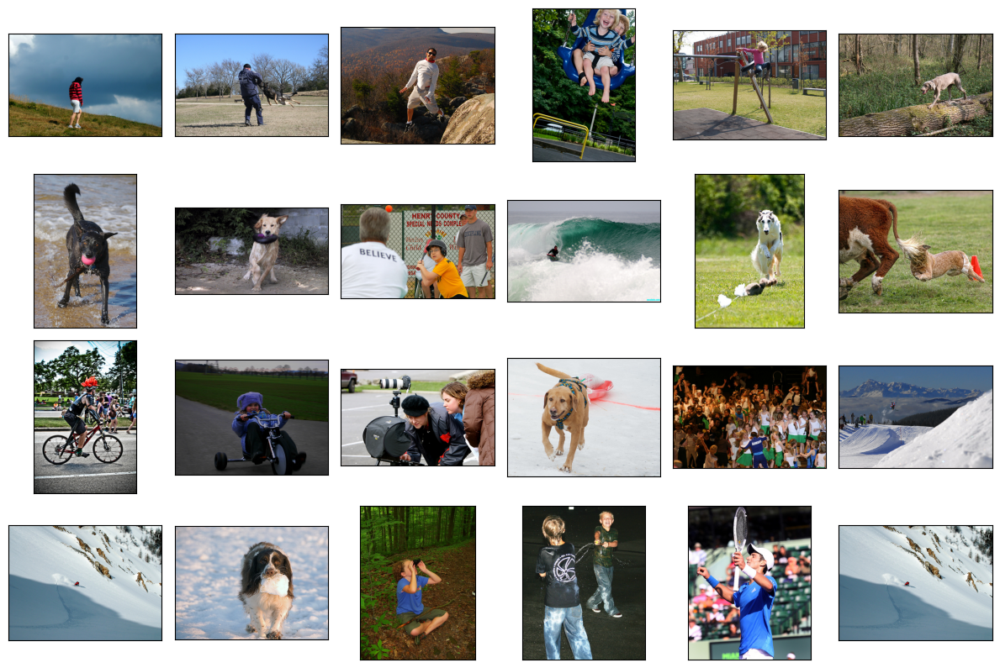

In [ ]:
#Списки со случайными фотографиями из тренировончого и тестового набора
foto_train_sample = list(df_train['image'].sample(12))
foto_test_sample = list(df_queries_test['image'].sample(12))

#Циклы для просмотра фото
fig = plt.figure(figsize=(12,12))
for i in range(12):
    fig.add_subplot(6, 6, i+1)
    image = Image.open(Path(path, 'train_images', foto_train_sample[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
for i in range(12):
    fig.add_subplot(6, 6, i+13)
    image = Image.open(Path(path, 'test_images', foto_test_sample[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

**Вывод**

Данные и их типы соответствуют описанию, пропусков и дублей нет

## Подготовка данных к обучению модели

### Обработка оценок
<a id='3-bullet'></a>

Имея оценку от 3 экспертов, можно принять за верную, если хотябы у 2 она совпала, и пропуск, если все 3 эксперта не сошлись

В Краудсорсинговых данных возьму долю людей, подтвердивших, что описание соответствует изображению   

In [ ]:
#Функция для оценок экспертов
def score_avg(s1, s2, s3):
    if s1==s2 or s1==s3:
        return s1
    elif s2==s3:
        return s2
    else:
        return np.nan

df_expert['score_avg'] = df_expert.apply(lambda x: score_avg(x['1'], x['2'], x['3']), axis=1)

#Удаление пустых строк
df_expert = df_expert.dropna(subset=['score_avg'])

#Нормализация
min = df_expert['score_avg'].min()
max = df_expert['score_avg'].max()

df_expert['score_exp'] = (df_expert['score_avg'] - min) / (max - min)

#Масштабирование оценок экспертов
#scaler = MinMaxScaler()
#df_expert[['score_exp']] = scaler.fit_transform(df_expert[['score_avg']])

for df_name in ['df_crowd', 'df_expert']:
    df = globals()[df_name]
    print(f"\nРазмер {df_name} до слияния:")
    print(len(df))

#Итоговый датафрейм с оценками
df_scores = pd.merge(df_expert, df_crowd, how='left', on=['image', 'query_id'])

#Удаление лишних столбцов
df_scores = df_scores.drop(['1', '2', '3', 'score_avg', 'count_pos', 'count_neg'], axis=1)

print("\nРазмер df_scores после слииния:")
print(len(df_scores))
display(df_scores.tail(3))


Размер df_crowd до слияния:
47830

Размер df_expert до слияния:
5696

Размер df_scores после слииния:
5696


<ipython-input-8-101afbef1e5f>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_expert['score_exp'] = (df_expert['score_avg'] - min) / (max - min)


,image,query_id,score_exp,share_pos
5693,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,0.000000,0.000000
5694,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,0.000000,NaN
5695,997722733_0cb5439472.jpg,486917990_72bd4069af.jpg#2,0.666667,0.333333


In [ ]:
#Функция для определения итоговой оценки, с повышен.коэф. эксперта
def score(s1, s2):
    if np.isnan(s1):
        return round(s2, 2)
    elif np.isnan(s2):
        return round(s1, 2)
    else:
        return round(s1*0.60+s2*0.40, 2)

df_scores['score'] = df_scores.apply(lambda x: score(x['score_exp'], x['share_pos']), axis=1)

#Удаление лишних столбцов
df_scores = df_scores.drop(['score_exp', 'share_pos'], axis=1)
df_scores.tail()

,image,query_id,score
5691,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,0.00
5692,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,0.00
5693,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,0.00
5694,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,0.00
5695,997722733_0cb5439472.jpg,486917990_72bd4069af.jpg#2,0.53


In [ ]:
#Копия тренировочного сета для работы с текстом
fill_text = df_train.copy().drop('image', axis=1)

#Добавление оценки к тренировочному сету
#df_train = (df_train.set_index(['image', 'query_id']).join(df_scores.set_index(['image', 'query_id'])[['score']],
#            how='outer',).reset_index())

print('Длина до объединения:', len(df_train))
df_train = pd.merge(df_train, df_scores, how='outer', on=['image', 'query_id'])
print('Длина после объединения:', len(df_train))

Длина до объединения: 5822
Длина после объединения: 5822


### Описания к фото
<a id='4-bullet'></a>

In [ ]:
#Извлечение имен фото с целью получиьть оригинальные пары фото-описание.
#fill_text['q_id'] = fill_text['query_id'].str[:-2]
#fill_text = fill_text.drop(['query_id'], axis=1)
#fill_text = fill_text.drop_duplicates()

#def fillna_text(row):
#    if pd.isnull(row['query_text']):
#        text = fill_text[fill_text['q_id'] == row['query_id'][:-2]]['query_text']
#        if len(text) > 0:
#            row['query_text'] = text.iloc[0]

#    return row

#df_train = df_train.apply(fillna_text, axis=1)

#Удаление строк, для которых не нашлось пары (фото-описание), они в дальнейшем будут бесполезны
#df_train = df_train.dropna()
#df_train.reset_index(drop=True, inplace=True)

#df_train.tail()

In [ ]:
#Cправочник слов-фото
dictionary = dict(zip(fill_text['query_id'], fill_text['query_text']))
dictionary = pd.DataFrame.from_dict(dictionary, orient='index', columns=['query_text']).reset_index()
dictionary.columns = ['query_id', 'query_text']

df_train = pd.merge(df_train, dictionary, how='outer', on=['query_id', 'query_text'])

print('Длина после объединения:', len(df_train))
#Удаление строк, для которых не нашлось пары (фото-описание), они в дальнейшем будут бесполезны
df_train = df_train.dropna()
df_train.reset_index(drop=True, inplace=True)
print('Длина после удаления:', len(df_train))

Длина после объединения: 5822
Длина после удаления: 5696


### Лемматизация и возрастные ограничения
<a id='5-bullet'></a>

In [ ]:
#Словарь с перечнем слов в английском, обозначающих ребёнка
stop_words_16 = ['bairn', 'baby', 'bambino', 'brat', 'changeling', 'cherub',
                 'child', 'gamin', 'imp', 'infant', 'juvenile', 'kid', 'laddie',
                 'lass', 'little one', 'moppet', 'nipper', 'offspring', 'progeny',
                 'scallywag', 'sprout', 'stripling', 'tike', 'tot', 'urchin',
                 'waif', 'youngling', 'youngster', 'youth',
                 'munchkin', 'youth', 'juveniles', 'infant', 'stripling', 'teen',
                 'minor', 'toddler', 'youngster', 'juvie', 'statutory', 'adolescent',
                 'underage', 'baby', 'kid', 'boy', 'child', 'teenager', 'children',
                 'girl']

#Загрузка стоп-слов
nltk.download('stopwords')
nlp = spacy.load('en_core_web_sm')
stop = set(nltk_stopwords.words('english') + ["im", "ill", "oh", "hey"])

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
#Функция для базовой очистки текста
def prepare_text(text):
    text = re.compile('\n').sub(' ', str(text).lower())
    text = re.compile('<[^>]*>').sub('', text)
    text = re.compile('\([^)]*\)').sub('', text)
    res_text = re.compile('[^а-яa-z\s]').sub('', text)
    res_text = res_text.lower()
    return re.compile('\s{2,}').sub(' ',res_text)

#Функция для обработки стоп-слов и лемматизации
def df_stop_words(Sr, stop):
    Sr_2 = Sr.copy()

    for itm in trange(len(Sr)):
        line = Sr_2[itm]
        line = prepare_text(line)
        line = [w for w in line.split() if w not in stop]
        line = " ".join(line)
        line = nlp(line)
        line = " ".join([token.lemma_ for token in line])
        Sr_2[itm] = line

    return Sr_2

#Добавление лемматизированного столбца
df_train['pure_text'] = df_stop_words(df_train['query_text'], stop)

100%|██████████| 5696/5696 [00:45<00:00, 126.39it/s]


In [ ]:
df_train.sample(8)

,image,query_id,query_text,score,pure_text
2760,2511019188_ca71775f2d.jpg,302983277_69a4e732e4.jpg#2,A man riding a brown horse poses in front of a mountain scene .,0.0,man ride brown horse pose front mountain scene
3791,2192131110_8a40e7c028.jpg,3334537556_a2cf4e9b9a.jpg#2,"Four people holding each others shoulders with a brown dog in front of them , standing on snow .",0.0,four people hold other shoulder brown dog front stand snow
3221,1389264266_8170bc1c54.jpg,3192266178_f9bf5d3dba.jpg#2,A man in a uniform playing with a black dog .,0.0,man uniform play black dog
3884,488356951_b3b77ad832.jpg,3361990489_92244a58ef.jpg#2,girl posing on tree,0.0,girl pose tree
4751,1248940539_46d33ed487.jpg,3601843201_4809e66909.jpg#2,A person wearing a red and white uniform is racing a motorcycle with the number 58 on it .,0.0,person wear red white uniform race motorcycle number
2958,447111935_5af98563e3.jpg,3108732084_565b423162.jpg#2,a snowboarder,0.0,snowboarder
1535,2064790732_219e52e19c.jpg,2498897831_0bbb5d5b51.jpg#2,Three little girls make silly faces on a wooden swing in an over saturated photo .,0.0,three little girl make silly face wooden swing saturate photo
2417,3246991821_750a3097e2.jpg,2901074943_041aba4607.jpg#2,A small girl is sitting on the cement dropping some chalk,0.2,small girl sit cement dropping chalk


In [ ]:
#Поиск фото с запрещённым текстом
def stop_row(row, a, b):
    row['mark'] = a
    text = row['pure_text']

    for w in text.split():
        if w in stop_words_16:
            if row['score'] >= 0.6:
                row['mark'] = b
            break

    return row


df_train = df_train.apply(lambda x:stop_row(x, 1, np.nan), axis=1)

#Удаление запретных фото
print('Длина до удаления:', len(df_train))
df_train = df_train.dropna()
print('Длина после удаления:', len(df_train))
df_train = df_train.drop(['mark'], axis=1)
df_train.reset_index(drop=True, inplace=True)

Длина до удаления: 5696
Длина после удаления: 5620


### Векторизация текстов
<a id='6-bullet'></a>

Для векторизации текстов выбираю Tf-idf, данный метод удобен и прост в реализации

In [ ]:
tf_converter = TfidfVectorizer()
tf_idf_train = tf_converter.fit_transform(df_train['pure_text']).toarray()

df_train['query_vector'] = tf_idf_train.tolist()

df_train.tail(2)

,image,query_id,query_text,score,pure_text,query_vector
5618,506738508_327efdf9c3.jpg,997722733_0cb5439472.jpg#2,A person in a red shirt climbing up a rock face covered in assist handles .,0.0,person red shirt climb rock face cover assist handle,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4717385626613016, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...]"
5619,968081289_cdba83ce2e.jpg,997722733_0cb5439472.jpg#2,A person in a red shirt climbing up a rock face covered in assist handles .,0.0,person red shirt climb rock face cover assist handle,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4717385626613016, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...]"


### Векторизация изображений
<a id='7-bullet'></a>

In [ ]:
#Путь к тренировочным фото
path1 = 'train_images'

#Инициализация модели
foto_vec_model = torchvision.models.resnet50(pretrained=True, progress=True)
foto_vec_model.fc = nn.Identity()

images = df_train['image'].unique().tolist()

#Подготовка изображений
preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )])

foto_vec_model.eval()

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
@lru_cache(maxsize=None)
def foto_vector(image_path):
    img = Image.open(image_path).convert('RGB')
    img_preprocessed = preprocess(img)

    #Отключение градиентов
    with torch.no_grad():
        batch_img_tensor = torch.unsqueeze(img_preprocessed, 0)

        #Логиты из модели
        foto = foto_vec_model(batch_img_tensor)

        #softmax для получения вероятностей
        #probabilities = F.softmax(foto, dim=1)

    #return probabilities.detach().numpy()[0]
    return foto.detach().numpy()[0]


#Словарь векторов
embeded_foto = []
for img_path in df_train['image'].unique():
    vector = foto_vector(Path(path, path1, img_path))
    embeded_foto.append(vector)

emb_foto = dict(zip(df_train['image'].unique(), embeded_foto))

def set_value(row_number, assigned_value):
    return assigned_value[row_number]

#Интеграция с тестовым датафреймом
df_train['foto_probs'] = df_train['image'].apply(set_value, args=(emb_foto,))

df_train.head(1)

,image,query_id,query_text,score,pure_text,query_vector,foto_probs
0,2647049174_0fb47cee2e.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen from behind .",0.0,woman signal traffic see behind,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.349498258671433, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...]","[0.23247604, 1.2819346, 0.05054601, 0.07521838, 0.31783763, 0.5868261, 0.03211099, 0.66555333, 0.08420871, 0.23528329, 0.1759864, 0.49648044, 0.39387357, 0.14374046, 0.22067116, 0.4667984, 0.17449138, 0.18458088, 0.29906708, 0.24489644, 0.34862268, 0.014903636, 0.4883036, 0.1542691, 0.50518477, 0.32501376, 0.5340841, 0.9075037, 0.677279, 0.38911772, 0.028511818, 0.8785648, 0.45039186, 0.107499816, 0.6152348, 0.24674124, 0.7829757, 0.28503695, 0.34881148, 0.6703355, 0.56871253, 0.10627482, 0.6613465, 0.11160082, 0.22216652, 0.89232975, 0.0133193955, 0.97724175, 0.15166157, 0.18388507, 0.25804785, 0.7569401, 0.17047907, 0.56128585, 0.10333538, 0.7942718, 0.0656097, 0.52268064, 0.6487979, 0.25953016, 0.11078448, 0.40071386, 0.72966826, 0.1631115, 0.04022405, 0.056627985, 0.45081866, 0.29694805, 0.08021689, 0.45486912, 0.5831835, 0.22531286, 0.5042031, 0.13371268, 0.10372271, 0.2759141, 0.065107964, 0.3492376, 0.9110417, 0.3547022, 0.280411, 0.18075046, 0.7796325, 0.44855097, 0.30071083, 2.3429317, 0.0, 0.07352128, 0.27856174, 0.30115977, 0.6645645, 0.78939253, 0.049954403, 0.07229375, 0.91763717, 0.093918025, 0.37483707, 0.34697646, 0.9652661, 1.1846877, ...]"


### Объединение векторов
<a id='8-bullet'></a>

In [ ]:
foto = df_train['foto_probs'].to_list()

print('Размер тренировочного датасета: ', len(foto))
print()
print('Размер векторно-тектового массива:', tf_idf_train.shape)
print()

X = np.concatenate((foto, tf_idf_train), axis=1)
print('Размер массива после объединения', X.shape)

y = np.array(df_train['score'])

Размер тренировочного датасета:  5620

Размер векторно-тектового массива: (5620, 1199)

Размер массива после объединения (5620, 3247)


Из-за того, что ResNet обучена на тысяче классов изображений, размер увеличился

## Обучение моделей



### Предобработка
<a id='9-bullet'></a>

In [ ]:
#Одно воспроизводимое разделение с обучающей выборкой в 70%
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=RNDSEED)

train_indices, val_indices = next(gss.split(X=X, y=y, groups=df_train['image']))

X_train, X_val = X[train_indices], X[val_indices]
y_train, y_val = y[train_indices], y[val_indices]

In [ ]:
#Масштабирование
#scaler = StandardScaler().fit(X_train)
#X_train = scaler.transform(X_train)
#X_val = scaler.transform(X_val)

### Линейная регрессия
<a id='10-bullet'></a>

In [ ]:
#Инициализация модели
model_linear = Sequential()

model_linear.add(Dense(units=1, input_dim=X.shape[1]))
model_linear.compile(loss='mean_squared_error', optimizer=Adam(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError()])

model_linear.fit(X_train, y_train, verbose=2, batch_size=256, epochs=8,
                 validation_data=(X_val, y_val))

Epoch 1/8


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 - 1s - 89ms/step - loss: 0.3275 - root_mean_squared_error: 0.5723 - val_loss: 0.1696 - val_root_mean_squared_error: 0.4118
Epoch 2/8
16/16 - 1s - 61ms/step - loss: 0.1709 - root_mean_squared_error: 0.4134 - val_loss: 0.1513 - val_root_mean_squared_error: 0.3890
Epoch 3/8
16/16 - 1s - 38ms/step - loss: 0.1230 - root_mean_squared_error: 0.3507 - val_loss: 0.1200 - val_root_mean_squared_error: 0.3464
Epoch 4/8
16/16 - 1s - 37ms/step - loss: 0.0995 - root_mean_squared_error: 0.3154 - val_loss: 0.1080 - val_root_mean_squared_error: 0.3287
Epoch 5/8
16/16 - 0s - 29ms/step - loss: 0.0862 - root_mean_squared_error: 0.2936 - val_loss: 0.1004 - val_root_mean_squared_error: 0.3169
Epoch 6/8
16/16 - 0s - 21ms/step - loss: 0.0780 - root_mean_squared_error: 0.2792 - val_loss: 0.0949 - val_root_mean_squared_error: 0.3080
Epoch 7/8
16/16 - 0s - 16ms/step - loss: 0.0723 - root_mean_squared_error: 0.2688 - val_loss: 0.0907 - val_root_mean_squared_error: 0.3011
Epoch 8/8
16/16 - 0s - 19ms/step - lo

### Полносвязная нейронная сеть
<a id='11-bullet'></a>

In [ ]:
def create_neural_network_model():
    model = Sequential()

    model.add(Dense(128, activation='relu', input_shape=(X_train.shape[1],)))
    model.add(BatchNormalization())
    model.add(Dropout(0.1))

    model.add(Dense(64, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))

    model.add(Dense(32, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))

    model.add(Dense(16, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.4))

    model.add(Dense(8, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))

    model.add(Dense(1))

    #Компиляция модели
    optimizer = Adam(learning_rate=0.0001)
    model.compile(optimizer=optimizer, loss='mean_squared_error',
                  metrics=[tf.keras.metrics.RootMeanSquaredError()]
    )

    return model

early_stopping = EarlyStopping(
    patience=16,
    min_delta=0.0001,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6
)

neural_network_model = create_neural_network_model()

class PrintEvery10Epochs(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if epoch % 10 == 0:
            print(f"\nЭпоха {epoch + 1}")
            print(f"RMSE на тренировочном наборе: {logs['root_mean_squared_error']:.4f}")
            print(f"RMSE на тесте: {logs['val_root_mean_squared_error']:.4f}")

history = neural_network_model.fit(
    X_train,
    y_train,
    batch_size=256,
    epochs=500,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping, reduce_lr, PrintEvery10Epochs()],
    verbose=0
)


Эпоха 1
RMSE на тренировочном наборе: 2.2265
RMSE на тесте: 0.2837

Эпоха 11
RMSE на тренировочном наборе: 2.0889
RMSE на тесте: 0.6093


## Тестирование модели

Для тестирования возьму нейросеть, её оценка при обучении оказалась лучше

### Предобработка и функции
<a id='12-bullet'></a>

In [ ]:
#Тестовый датафрейм
df_test = df_queries_test.copy()
df_test.reset_index(drop=True, inplace=True)

In [ ]:
#Векторизация
path3 = 'test_images'

test_embeded_foto = []
for img_path in df_test['image'].unique():
    vector = foto_vector(Path(path, path3, img_path))
    test_embeded_foto.append(vector)

test_emb_foto = dict(zip(df_test['image'].unique(), test_embeded_foto))

df_test = df_test.drop(['query_id', 'query_text'], axis=1)
df_test = df_test.drop_duplicates()

#Интеграция с тестовым датафреймом
df_test['foto_probs'] = df_test['image'].apply(set_value, args=(test_emb_foto,))


In [ ]:
#Функция со стоп-словами
def is_stop(text):
    for w in text.split():
        if w in stop_words_16:
            return True
    return False

#Функция для лемматизации слов
def clr_line(line):
    line = prepare_text(line)
    line = [w for w in line.split() if w not in stop]
    line = " ".join(line)
    line = nlp(line)
    line = " ".join([token.lemma_ for token in line])
    return line

In [ ]:
def this_foto(query):

    #Лемматизация
    line = clr_line(query)
    #Проверка на стоп-слова
    if is_stop(line):
        print(f'\nДля запроса *{query}* модель не может найти изображение:\n')
        print('This image is unavailable in your country.\n')
    else:

        #Предобработка
        tf_idf_query = tf_converter.transform(query).toarray()[0]

        q_vec_all = []

        for j in range(len(test_embeded_foto)):
            q_vec_all.append(tf_idf_query)
        q_vec_all = np.array(q_vec_all)

        X_test = np.concatenate((test_embeded_foto, q_vec_all), axis=1)
        #X_test = scaler.transform(X_test)

        #Предсказания
        prediction = neural_network_model.predict(X_test)

        df_test['prediction'] = prediction
        df = df_test.sort_values(by='prediction', ascending=False)
        line = df.head(1)
        name_foto = line['image'].tolist()[0]

        #Вывод изображения
        fig = plt.figure(figsize=(5,5))
        image = Image.open(Path(path, path3, name_foto))
        plt.imshow(image)
        plt.title(f'Для запроса *{query}* модель подобрала следующее изображение:\n')

        #Исходник
        fig = plt.figure(figsize=(5,5))
        image = Image.open(Path(path, path3, name_foto_origin))
        plt.imshow(image)
        plt.title(f'Оригинальное фото:\n')
        print('\n\n')

### Демонстрация подбора изображений
<a id='13-bullet'></a>

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step




Для запроса *['A girl in a purple shirt feeding ducks']* модель не может найти изображение:

This image is unavailable in your country.

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step




Для запроса *['The little boy is smiling as he crosses a rope on an assault course .']* модель не может найти изображение:

This image is unavailable in your country.


Для запроса *['a boy flings sand at a girl .']* модель не может найти изображение:

This image is unavailable in your country.

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 





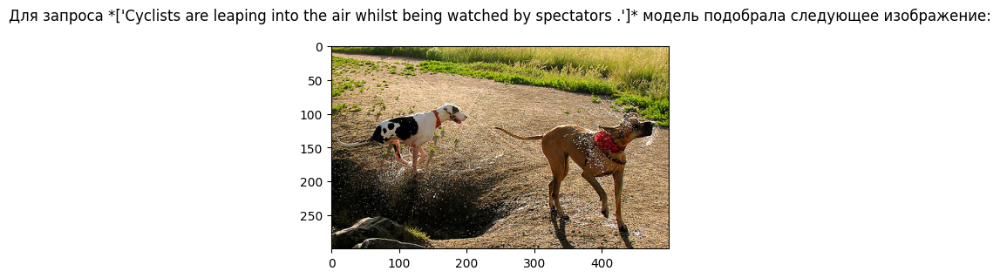

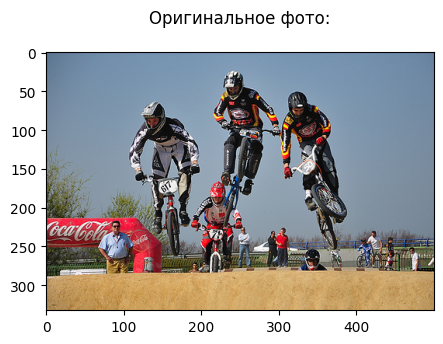

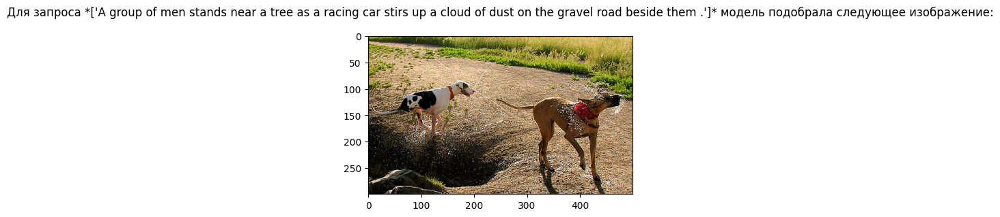

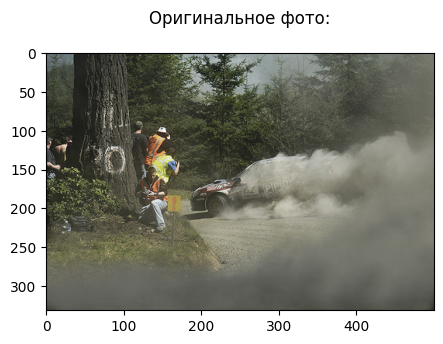

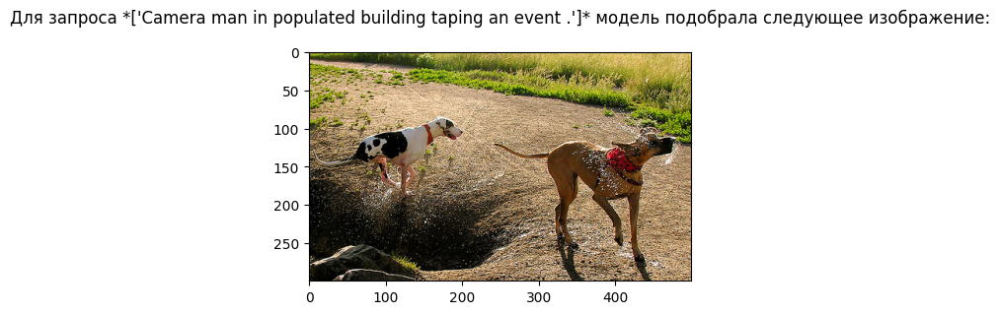

...

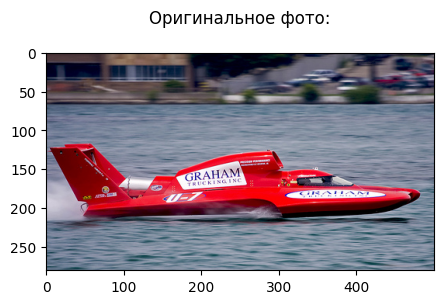

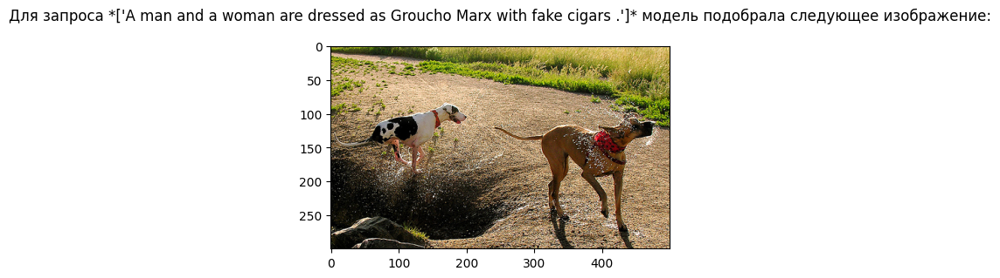

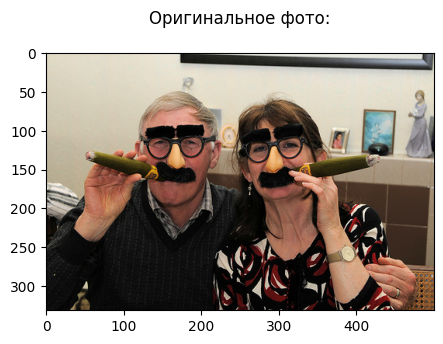

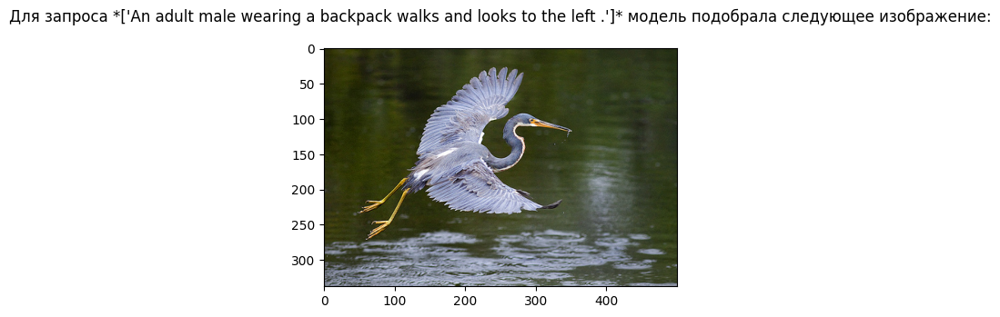

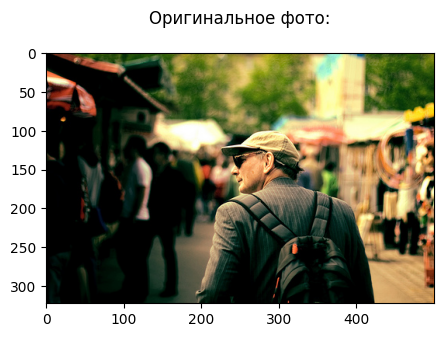

In [ ]:
#Демонстрационный цикл
for i in range(12):
    query_line = df_queries_test.sample(1)
    query = query_line['query_text'].tolist()
    name_foto_origin = query_line['image'].tolist()[0]
    this_foto(query)

## Общий вывод

Точность работы модели оставляет желать лучшего, модель ошибается практически во всем, заказчику не рекомендуется использовать нейросеть для данной задачи

Возможно стоит увеличить кол-во изображений-описаний для обучения модели (не стоит зыбвать, что обучение происходило на 1к уникальных значений изображений и текста, плюс возрастная фильтрация) или попробовать другие методы векторизации и архитектуры сети, или использовать для обучения уже готовые модели, допустим существует Нейронная Сеть CLIP(Contrastive Language-Image Pre-training), и множество других, далее пример реализации обученной модели для выполнения задачи


In [ ]:
model = SentenceTransformer('clip-ViT-B-32')

def embed_foto(path1, images, arr, text_emb):
    for i in range(len(images)):
        img = Image.open(Path(path, path1, images[i])).convert('RGB')

        img_emb = model.encode(img)

        cos_scores = util.cos_sim(img_emb, text_emb)
        arr.append(cos_scores)
    return arr



def embed_foto(path1, images, arr, text_emb):
    for i in range(len(images)):
        img = Image.open(Path(path, path1, images[i])).convert('RGB')

        img_emb = model.encode(img)

        cos_scores = util.cos_sim(img_emb, text_emb)
        arr.append(cos_scores)
    return arr


def this_foto_CLIP(query):

    line = clr_line(query)
    if is_stop(line):
        print(f'\nДля запроса *{query}* модель не может найти изображение:\n')
        print('This image is unavailable in your country.\n')
    else:
        text_emb = model.encode([line])
        scores = []
        scores = embed_foto(path3, df_test['image'].unique(), scores, text_emb)

        df_test['scores'] = scores
        df = df_test.sort_values(by='scores', ascending=False)
        line = df.head(1)
        name_foto = line['image'].tolist()[0]

        fig = plt.figure(figsize=(5,5))
        image = Image.open(Path(path, path3, name_foto))
        plt.imshow(image)
        plt.title(f'Для запроса *{query}* модель подобрала следующее изображение:\n')

        fig = plt.figure(figsize=(5,5))
        image = Image.open(Path(path, path3, name_foto_origin))
        plt.imshow(image)
        plt.title(f'Оригинальное фото:\n')
        print('\n\n')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(









Для запроса *['A boy plays basketball .']* модель не может найти изображение:

This image is unavailable in your country.

















Для запроса *['A little girl leans over the side of a wall to feed ducks in the water .']* модель не может найти изображение:

This image is unavailable in your country.





Для запроса *['Two girls in pink are playing on yellow playground bars .']* модель не может найти изображение:

This image is unavailable in your country.


Для запроса *['A young boy is throwing something into a river .']* модель не может найти изображение:

This image is unavailable in your country.



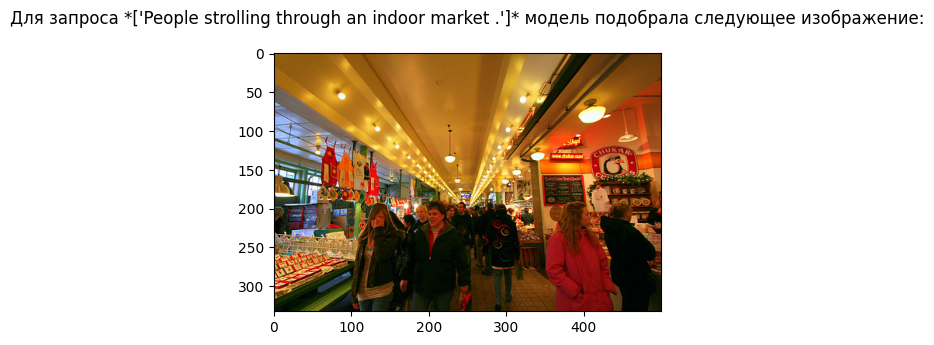

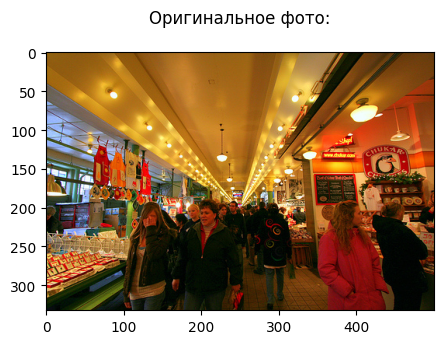

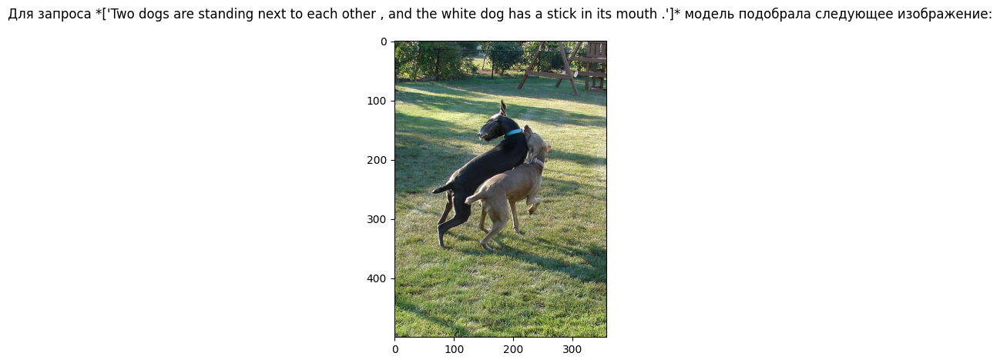

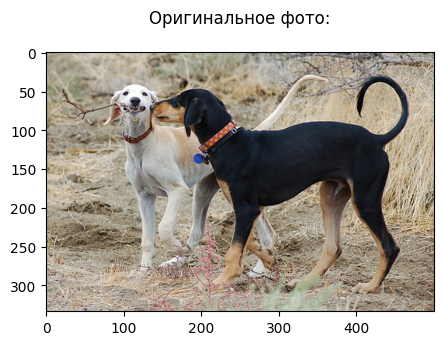

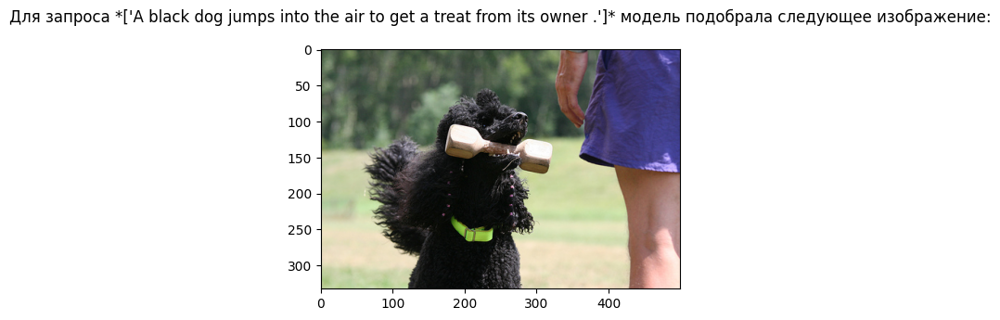

...

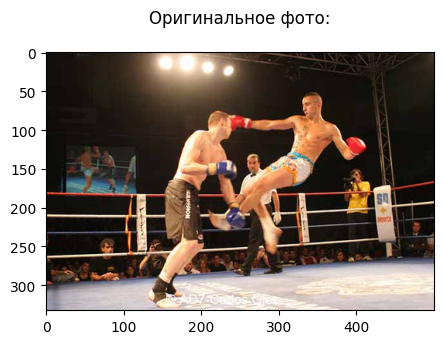

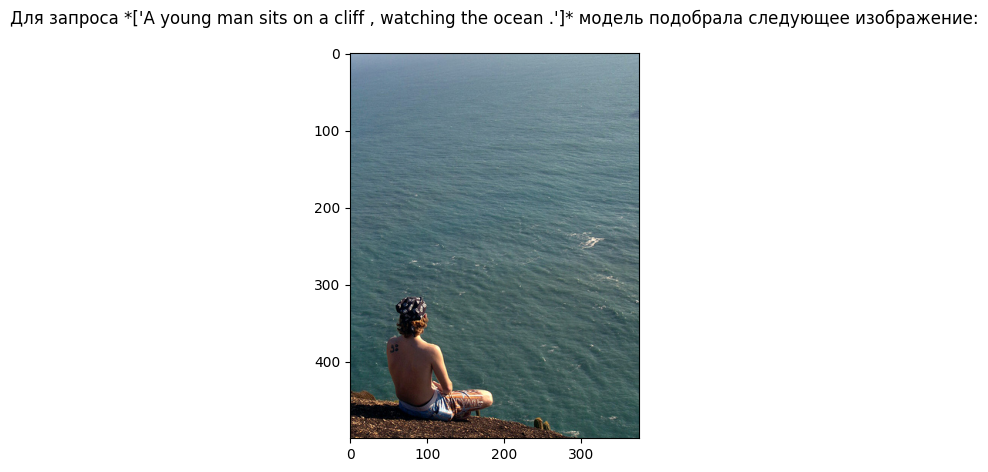

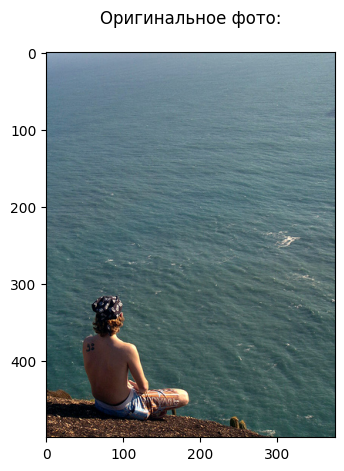

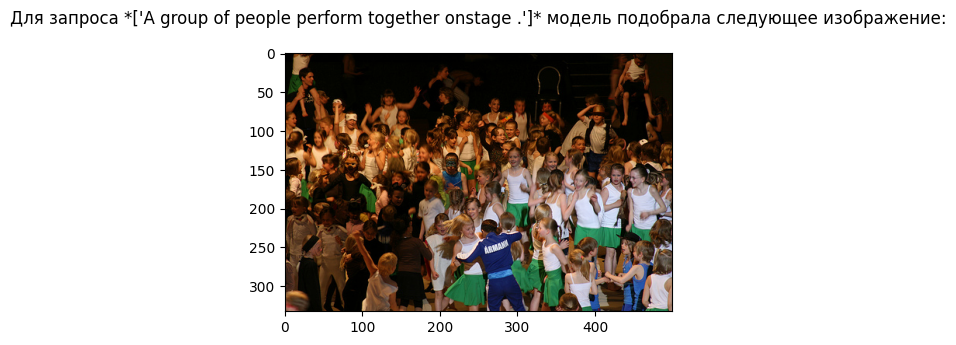

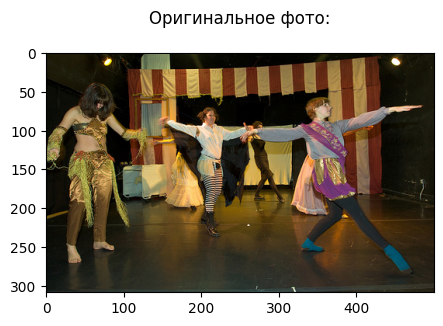

In [ ]:
for i in range(12):
    query_line = df_queries_test.sample(1)
    query = query_line['query_text'].tolist()
    name_foto_origin = query_line['image'].tolist()[0]
    this_foto_CLIP(query)

**Вывод**

Подбор изображений моделью CLIP достаточно точный, можно рекомендовать заказчику